In [4]:
import numpy as np 
import pandas as pd
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.metrics import mean_squared_error,r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn import model_selection
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV,ElasticNet,ElasticNetCV,LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn import neighbors
from sklearn.svm import SVR
import warnings
warnings.filterwarnings("ignore")

In [8]:
df=pd.read_csv('C:/Users/rishitha/Desktop/TRAIN.csv')
df.head()


,ID,Store_id,Store_Type,Location_Type,Region_Code,Date,Holiday,Discount,#Order,Sales
0,T1000001,1,S1,L3,R1,2018-01-01,1,Yes,9,7011.84
1,T1000002,253,S4,L2,R1,2018-01-01,1,Yes,60,51789.12
2,T1000003,252,S3,L2,R1,2018-01-01,1,Yes,42,36868.20
3,T1000004,251,S2,L3,R1,2018-01-01,1,Yes,23,19715.16
4,T1000005,250,S2,L3,R4,2018-01-01,1,Yes,62,45614.52


In [9]:
df.tail()

,ID,Store_id,Store_Type,Location_Type,Region_Code,Date,Holiday,Discount,#Order,Sales
188335,T1188336,149,S2,L3,R2,2019-05-31,1,Yes,51,37272.00
188336,T1188337,153,S4,L2,R1,2019-05-31,1,No,90,54572.64
188337,T1188338,154,S1,L3,R2,2019-05-31,1,No,56,31624.56
188338,T1188339,155,S3,L1,R2,2019-05-31,1,Yes,70,49162.41
188339,T1188340,152,S2,L1,R1,2019-05-31,1,No,47,37977.00


In [10]:
df.shape

(188340, 10)

In [11]:
df.columns

Index(['ID', 'Store_id', 'Store_Type', 'Location_Type', 'Region_Code', 'Date',
       'Holiday', 'Discount', '#Order', 'Sales'],
      dtype='object')

In [12]:
df.columns=df.columns.str.lstrip("#").str.lower()
df.head(2)

,id,store_id,store_type,location_type,region_code,date,holiday,discount,order,sales
0,T1000001,1,S1,L3,R1,2018-01-01,1,Yes,9,7011.84
1,T1000002,253,S4,L2,R1,2018-01-01,1,Yes,60,51789.12


In [13]:
df.dtypes

id                object
store_id           int64
store_type        object
location_type     object
region_code       object
date              object
holiday            int64
discount          object
order              int64
sales            float64
dtype: object

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188340 entries, 0 to 188339
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   id             188340 non-null  object 
 1   store_id       188340 non-null  int64  
 2   store_type     188340 non-null  object 
 3   location_type  188340 non-null  object 
 4   region_code    188340 non-null  object 
 5   date           188340 non-null  object 
 6   holiday        188340 non-null  int64  
 7   discount       188340 non-null  object 
 8   order          188340 non-null  int64  
 9   sales          188340 non-null  float64
dtypes: float64(1), int64(3), object(6)
memory usage: 14.4+ MB


In [15]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
store_id,188340.0,183.000000,105.366308,1.0,92.0,183.0,274.0,365.0
holiday,188340.0,0.131783,0.338256,0.0,0.0,0.0,0.0,1.0
order,188340.0,68.205692,30.467415,0.0,48.0,63.0,82.0,371.0
sales,188340.0,42784.327982,18456.708302,0.0,30426.0,39678.0,51909.0,247215.0


In [16]:
df.describe([0.1,0.25,0.4,0.5,0.65,0.75,0.9,0.95]).T

,count,mean,std,min,10%,25%,40%,50%,65%,75%,90%,95%,max
store_id,188340.0,183.000000,105.366308,1.0,37.000,92.0,146.6,183.0,238.0,274.0,329.0,347.0,365.0
holiday,188340.0,0.131783,0.338256,0.0,0.000,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
order,188340.0,68.205692,30.467415,0.0,37.000,48.0,57.0,63.0,73.0,82.0,107.0,126.0,371.0
sales,188340.0,42784.327982,18456.708302,0.0,23439.756,30426.0,35940.0,39678.0,46212.0,51909.0,66282.0,76809.3,247215.0


In [17]:
df.nunique()

id               188340
store_id            365
store_type            4
location_type         5
region_code           4
date                516
holiday               2
discount              2
order               299
sales             47422
dtype: int64

In [18]:
df.drop("id",axis=1,inplace=True)
df.head(2)

,store_id,store_type,location_type,region_code,date,holiday,discount,order,sales
0,1,S1,L3,R1,2018-01-01,1,Yes,9,7011.84
1,253,S4,L2,R1,2018-01-01,1,Yes,60,51789.12


In [20]:
col=["store_type","location_type","region_code","holiday","discount"]

for i in col:
    print(df[i].value_counts())
    print("*"*30)

S1    88752
S4    45924
S2    28896
S3    24768
Name: store_type, dtype: int64
******************************
L1    85140
L2    48504
L3    29928
L5    13932
L4    10836
Name: location_type, dtype: int64
******************************
R1    63984
R2    54180
R3    44376
R4    25800
Name: region_code, dtype: int64
******************************
0    163520
1     24820
Name: holiday, dtype: int64
******************************
No     104051
Yes     84289
Name: discount, dtype: int64
******************************


In [21]:
df.sort_values("sales",ascending=False).head(15)  # highest

,store_id,store_type,location_type,region_code,date,holiday,discount,order,sales
178648,175,S4,L2,R1,2019-05-05,0,Yes,371,247215.00
178372,87,S4,L2,R3,2019-05-04,0,Yes,233,227127.00
178304,175,S4,L2,R1,2019-05-04,0,Yes,348,222516.00
63672,337,S4,L2,R1,2018-06-24,0,Yes,316,219984.00
168624,315,S4,L2,R1,2019-04-07,0,Yes,331,211914.00
178553,146,S4,L2,R1,2019-05-05,0,Yes,306,205605.00
68703,175,S4,L2,R1,2018-07-08,0,Yes,333,203337.00
155790,175,S4,L2,R1,2019-03-03,0,Yes,347,200742.00
183128,175,S4,L2,R1,2019-05-17,0,Yes,309,199839.00
183251,175,S4,L2,R1,2019-05-18,1,No,361,197840.61


In [22]:
df.sort_values("sales",ascending=True).head(15)  # lowest

,store_id,store_type,location_type,region_code,date,holiday,discount,order,sales
166849,204,S4,L1,R3,2019-04-03,0,No,0,0.0
97301,271,S1,L3,R2,2018-09-24,0,No,0,0.0
146897,276,S1,L1,R2,2019-02-07,0,No,0,0.0
119242,298,S4,L1,R1,2018-11-23,1,No,0,0.0
150650,317,S3,L1,R1,2019-02-17,0,No,0,0.0
112853,39,S4,L1,R1,2018-11-06,1,No,0,0.0
99489,12,S1,L3,R2,2018-09-30,0,No,0,0.0
99904,12,S1,L3,R2,2018-10-01,0,No,0,0.0
118972,298,S4,L1,R1,2018-11-22,0,No,0,0.0
113444,39,S4,L1,R1,2018-11-07,1,No,0,0.0


In [23]:
df.sort_values("order",ascending=False).head(10) #highest

,store_id,store_type,location_type,region_code,date,holiday,discount,order,sales
178648,175,S4,L2,R1,2019-05-05,0,Yes,371,247215.00
183251,175,S4,L2,R1,2019-05-18,1,No,361,197840.61
178304,175,S4,L2,R1,2019-05-04,0,Yes,348,222516.00
155790,175,S4,L2,R1,2019-03-03,0,Yes,347,200742.00
68703,175,S4,L2,R1,2018-07-08,0,Yes,333,203337.00
168624,315,S4,L2,R1,2019-04-07,0,Yes,331,211914.00
174229,315,S4,L2,R1,2019-04-23,0,No,320,168129.00
63672,337,S4,L2,R1,2018-06-24,0,Yes,316,219984.00
183128,175,S4,L2,R1,2019-05-17,0,Yes,309,199839.00
178553,146,S4,L2,R1,2019-05-05,0,Yes,306,205605.00


In [24]:
df.sort_values("order").head(10) #lowest

,store_id,store_type,location_type,region_code,date,holiday,discount,order,sales
99489,12,S1,L3,R2,2018-09-30,0,No,0,0.0
166849,204,S4,L1,R3,2019-04-03,0,No,0,0.0
166738,204,S4,L1,R3,2019-04-02,0,No,0,0.0
112853,39,S4,L1,R1,2018-11-06,1,No,0,0.0
97480,271,S1,L3,R2,2018-09-25,0,No,0,0.0
146897,276,S1,L1,R2,2019-02-07,0,No,0,0.0
23867,311,S4,L2,R2,2018-03-07,0,No,0,0.0
113444,39,S4,L1,R1,2018-11-07,1,No,0,0.0
97301,271,S1,L3,R2,2018-09-24,0,No,0,0.0
168885,315,S4,L2,R1,2019-04-08,0,No,0,0.0


In [25]:
df.groupby("discount")["sales"].describe().T

discount,No,Yes
count,104051.000000,84289.000000
mean,37403.679678,49426.497620
std,16039.555183,19071.656642
min,0.000000,1969.140000
25%,27069.000000,36625.350000
50%,34791.000000,46242.000000
75%,44968.500000,58869.000000
max,197840.610000,247215.000000


In [26]:
df.groupby("discount")["order"].describe().T

discount,No,Yes
count,104051.000000,84289.000000
mean,61.806153,76.105637
std,28.046407,31.467192
min,0.000000,3.000000
25%,44.000000,55.000000
50%,57.000000,70.000000
75%,74.000000,91.000000
max,361.000000,371.000000


In [27]:
df.groupby("discount")["order"].describe().T

discount,No,Yes
count,104051.000000,84289.000000
mean,61.806153,76.105637
std,28.046407,31.467192
min,0.000000,3.000000
25%,44.000000,55.000000
50%,57.000000,70.000000
75%,74.000000,91.000000
max,361.000000,371.000000


In [28]:
df[df.sales==247215]

,store_id,store_type,location_type,region_code,date,holiday,discount,order,sales
178648,175,S4,L2,R1,2019-05-05,0,Yes,371,247215.0


In [29]:
df.isna().sum()

store_id         0
store_type       0
location_type    0
region_code      0
date             0
holiday          0
discount         0
order            0
sales            0
dtype: int64

In [30]:
from datetime import datetime 

In [31]:
df["date"] = pd.to_datetime(df.date)

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188340 entries, 0 to 188339
Data columns (total 9 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   store_id       188340 non-null  int64         
 1   store_type     188340 non-null  object        
 2   location_type  188340 non-null  object        
 3   region_code    188340 non-null  object        
 4   date           188340 non-null  datetime64[ns]
 5   holiday        188340 non-null  int64         
 6   discount       188340 non-null  object        
 7   order          188340 non-null  int64         
 8   sales          188340 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(3), object(4)
memory usage: 12.9+ MB


In [33]:
df['year'] = df['date'].dt.year 
df['month'] = df['date'].dt.month 
df["day"]=df["date"].dt.day

In [34]:
df.head()

,store_id,store_type,location_type,region_code,date,holiday,discount,order,sales,year,month,day
0,1,S1,L3,R1,2018-01-01,1,Yes,9,7011.84,2018,1,1
1,253,S4,L2,R1,2018-01-01,1,Yes,60,51789.12,2018,1,1
2,252,S3,L2,R1,2018-01-01,1,Yes,42,36868.20,2018,1,1
3,251,S2,L3,R1,2018-01-01,1,Yes,23,19715.16,2018,1,1
4,250,S2,L3,R4,2018-01-01,1,Yes,62,45614.52,2018,1,1


In [35]:
df.groupby("month")[["order","sales"]].describe().T

month                   1              2              3              4   \
order count   22630.000000   20440.000000   22630.000000   21900.000000   
      mean       66.933672      67.453474      67.761688      68.212968   
      std        28.851544      27.955358      30.903661      31.106559   
      min         7.000000       0.000000       0.000000       0.000000   
      25%        47.000000      49.000000      48.000000      47.000000   
      50%        61.000000      62.000000      63.000000      62.000000   
      75%        80.000000      80.000000      82.000000      82.000000   
      max       305.000000     306.000000     347.000000     331.000000   
sales count   22630.000000   20440.000000   22630.000000   21900.000000   
      mean    44979.147732   40424.350645   40979.577286   40773.681352   
      std     18890.563378   15663.007346   17792.866523   17741.049089   
      min      4591.620000       0.000000       0.000000       0.000000   
      25%     31706.580000   29703.000000   29526.750000   28767.000000   
      50%     41733.000000   37707.000000   38698.035000   37079.610000   
      75%     54608.250000   48303.750000   50339.250000   48943.500000   
      max    186444.000000  189174.000000  200742.000000  211914.000000   

month                   5              6              7              8   \
order count   22630.000000   10950.000000   11315.000000   11315.000000   
      mean       71.100044      66.174155      76.048873      67.128502   
      std        31.454542      28.861483      33.686867      28.912829   
      min         8.000000       8.000000      10.000000       6.000000   
      25%        50.000000      47.000000      53.000000      47.000000   
      50%        64.000000      60.000000      68.000000      62.000000   
      75%        85.000000      79.000000      91.000000      81.000000   
      max       371.000000     316.000000     333.000000     290.000000   
sales count   22630.000000   10950.000000   11315.000000   11315.000000   
      mean    48115.830407   44705.726389   46585.406232   40020.368869   
      std     20116.715253   18582.035516   19577.964004   16343.575156   
      min      4737.000000    4878.000000    5646.000000    3421.440000   
      25%     34461.000000   32004.750000   32923.500000   28681.500000   
      50%     44322.000000   41283.000000   42267.000000   37663.740000   
      75%     57480.172500   53550.000000   56059.500000   48621.000000   
      max    247215.000000  219984.000000  203337.000000  169908.000000   

month                   9              10             11             12  
order count   10950.000000   11315.000000   10950.000000   11315.000000  
      mean       68.509954      65.460009      63.416438      69.479806  
      std        28.907884      29.021450      33.601365      31.205532  
      min         0.000000       0.000000       0.000000       2.000000  
      25%        49.000000      45.000000      44.000000      50.000000  
      50%        63.000000      60.000000      60.000000      65.000000  
      75%        82.000000      79.000000      80.000000      84.000000  
      max       304.000000     245.000000     296.000000     290.000000  
sales count   10950.000000   11315.000000   10950.000000   11315.000000  
      mean    41123.184822   38988.407398   38160.962496   46477.110199  
      std     16460.132331   16226.188885   19719.378047   20188.802124  
      min         0.000000       0.000000       0.000000    1969.140000  
      25%     29823.750000   27523.500000   26642.100000   33504.000000  
      50%     38202.000000   36294.000000   36469.500000   43659.000000  
      75%     49631.760000   47499.000000   48780.000000   56931.000000  
      max    182586.000000  135630.000000  183906.000000  187077.000000

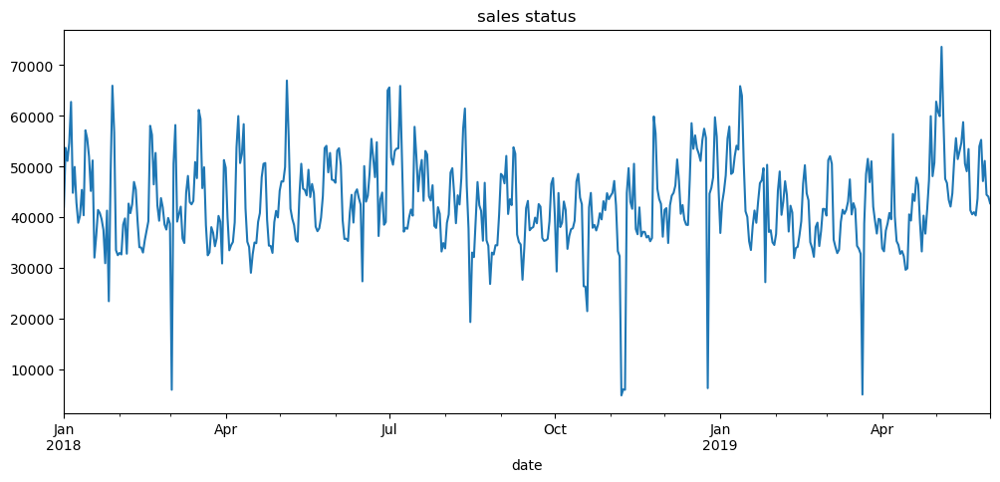

In [36]:
custgroup=df.groupby('date').mean()
plt.figure(figsize=(12,5))
custgroup['sales'].plot(x=df.date)
plt.title("sales status")
plt.show()


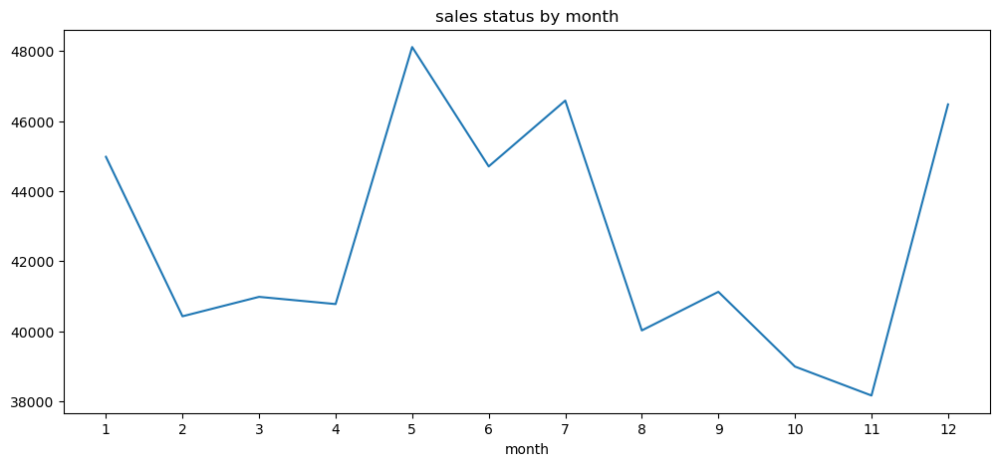

In [37]:
custgroup=df.groupby('month').mean()
fig,ax=plt.subplots(figsize=(12,5))
ax.xaxis.set(ticks=range(0,13))
custgroup['sales'].plot(x=df.date)
plt.title("sales status by month")
plt.show()

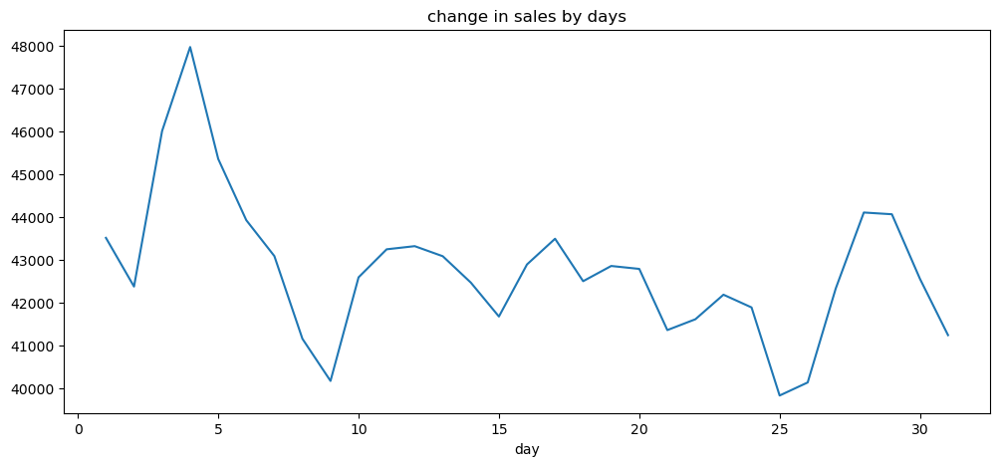

In [38]:
custgroup=df.groupby('day').mean()
plt.figure(figsize=(12,5))
custgroup['sales'].plot(x=df.date)
plt.title("change in sales by days")
plt.show()

In [39]:
cat_list=[]
num_list=[]

for i in df.columns:
    unique_val=len(df[i].unique())
    
    if unique_val<32:
        cat_list.append(i)
    else:
        num_list.append(i)

In [40]:
cat_list

['store_type',
 'location_type',
 'region_code',
 'holiday',
 'discount',
 'year',
 'month',
 'day']

In [41]:
num_list

['store_id', 'date', 'order', 'sales']

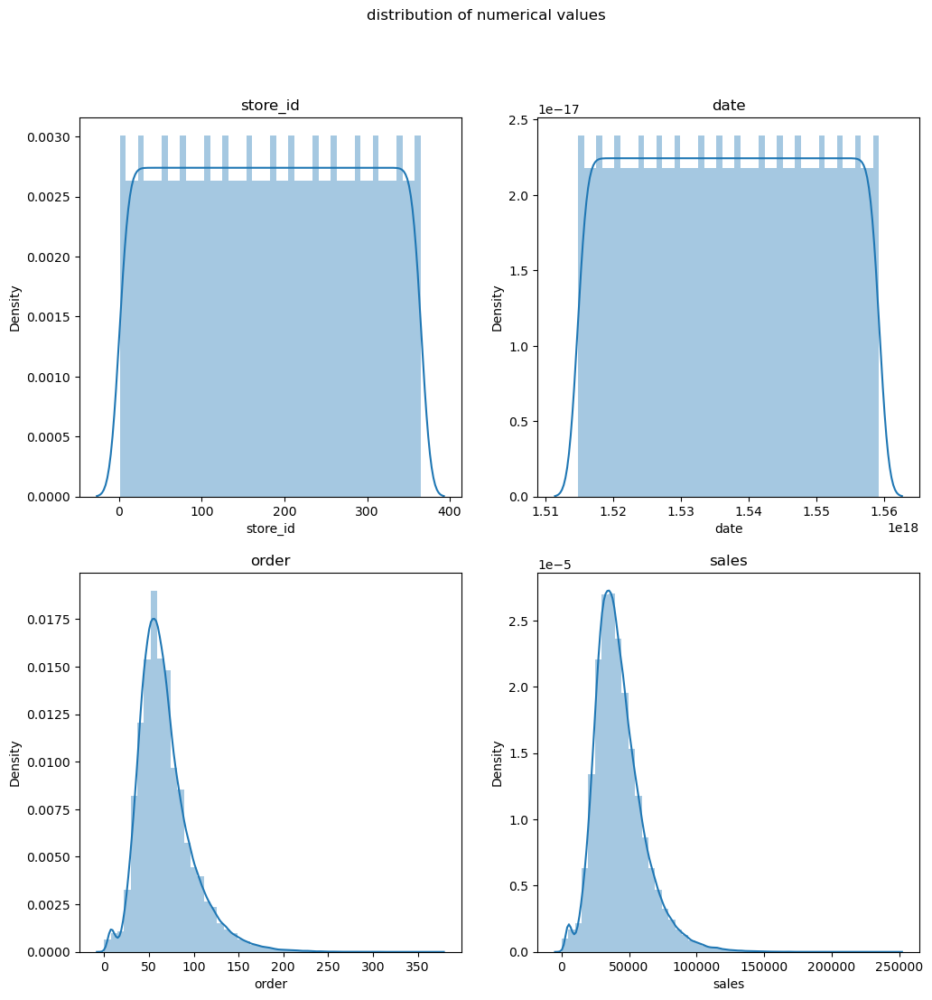

In [42]:
k=1
plt.figure(figsize=(12,12))
plt.tight_layout()
plt.suptitle("distribution of numerical values")


for i in df.loc[:,num_list]:
    plt.subplot(2,2,k)    
    sns.distplot(df[i])
    plt.title(i)
    k+=1

In [43]:
out_list=["order","sales"]

df.loc[:,out_list].describe([0.1,0.25,0.4,0.5,0.65,0.75,0.9,0.95,0.97]).T

,count,mean,std,min,10%,25%,40%,50%,65%,75%,90%,95%,97%,max
order,188340.0,68.205692,30.467415,0.0,37.000,48.0,57.0,63.0,73.0,82.0,107.0,126.0,139.0,371.0
sales,188340.0,42784.327982,18456.708302,0.0,23439.756,30426.0,35940.0,39678.0,46212.0,51909.0,66282.0,76809.3,84738.0,247215.0


In [44]:
for i in df.loc[:,out_list]:
    Q1 = df[i].quantile(0.1)
    Q3 = df[i].quantile(0.9)
    IQR = Q3-Q1
    up = Q3 + 1.5*IQR
    low = Q1 - 1.5*IQR

    if df[(df[i] > up) | (df[i] < low)].any(axis=None):
        print(i,"yes")
    else:
        print(i, "no")

order yes
sales yes


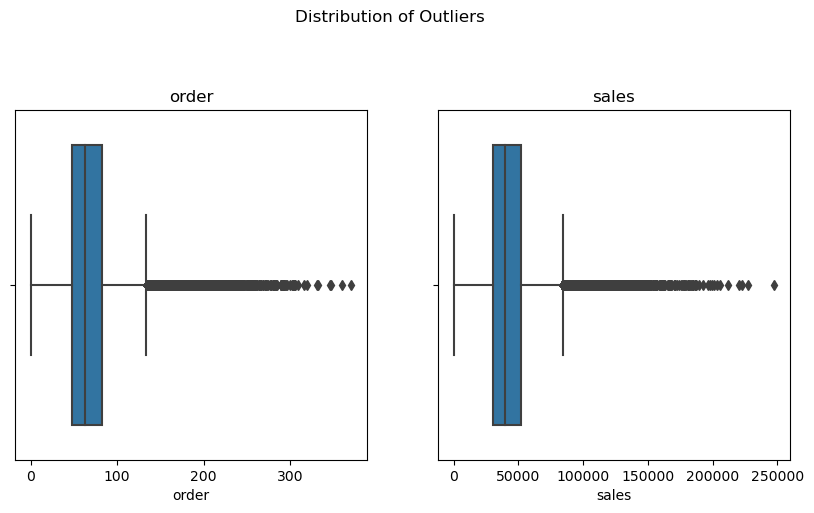

In [45]:
k=1
plt.figure(figsize=(10,10))
plt.suptitle("Distribution of Outliers")

for i in df.loc[:,out_list]:
    plt.subplot(2,2,k)
    sns.boxplot(x = i, data = df.loc[:,out_list])
    plt.title(i)
    k+=1

In [46]:
def outliers_train3(df):
    q1,q3=np.percentile(df,[5,95])
    ıqr=q3-q1
    low,high=q1-1.5*(ıqr),q3+1.5*(ıqr)
    outliers_train3=[i for i in df if i<low or i>high]
    return outliers_train3

In [47]:
len(outliers_train3(df.sales))

53

In [48]:
len(outliers_train3(df.order))

51

In [50]:
df_out_remove=df.copy()

In [51]:
for i in df_out_remove.loc[:,out_list]:
    
    Q1 = df_out_remove[i].quantile(0.05)
    Q3 = df_out_remove[i].quantile(0.95)
    IQR = Q3 - Q1
    up_lim=Q3+1.5 *IQR
    low_lim=Q1-1.5 *IQR
    
    df_out_remove.loc[df[i]>up_lim,i]=up_lim
    df_out_remove.loc[df[i]<low_lim,i]=low_lim

In [53]:
for i in df_out_remove.loc[:,out_list]:
    Q1 = df_out_remove[i].quantile(0.05)
    Q3 = df_out_remove[i].quantile(0.95)
    IQR = Q3-Q1
    up = Q3 + 1.5*IQR
    low = Q1 - 1.5*IQR

    if df_out_remove[(df_out_remove[i] > up) | (df_out_remove[i] < low)].any(axis=None):
        print(i,"yes")
    else:
        print(i, "no")

order no
sales no


In [54]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
store_id,188340.0,183.000000,105.366308,1.0,92.0,183.0,274.0,365.0
holiday,188340.0,0.131783,0.338256,0.0,0.0,0.0,0.0,1.0
order,188340.0,68.205692,30.467415,0.0,48.0,63.0,82.0,371.0
sales,188340.0,42784.327982,18456.708302,0.0,30426.0,39678.0,51909.0,247215.0
year,188340.0,2018.292636,0.454974,2018.0,2018.0,2018.0,2019.0,2019.0
month,188340.0,5.498062,3.399450,1.0,3.0,5.0,8.0,12.0
day,188340.0,15.691860,8.783156,1.0,8.0,16.0,23.0,31.0


In [55]:
df_out_remove.describe().T


,count,mean,std,min,25%,50%,75%,max
store_id,188340.0,183.000000,105.366308,1.0,92.0,183.0,274.0,365.00
holiday,188340.0,0.131783,0.338256,0.0,0.0,0.0,0.0,1.00
order,188340.0,68.198367,30.413517,0.0,48.0,63.0,82.0,268.50
sales,188340.0,42778.688626,18414.394265,0.0,30426.0,39678.0,51909.0,163236.75
year,188340.0,2018.292636,0.454974,2018.0,2018.0,2018.0,2019.0,2019.00
month,188340.0,5.498062,3.399450,1.0,3.0,5.0,8.0,12.00
day,188340.0,15.691860,8.783156,1.0,8.0,16.0,23.0,31.00


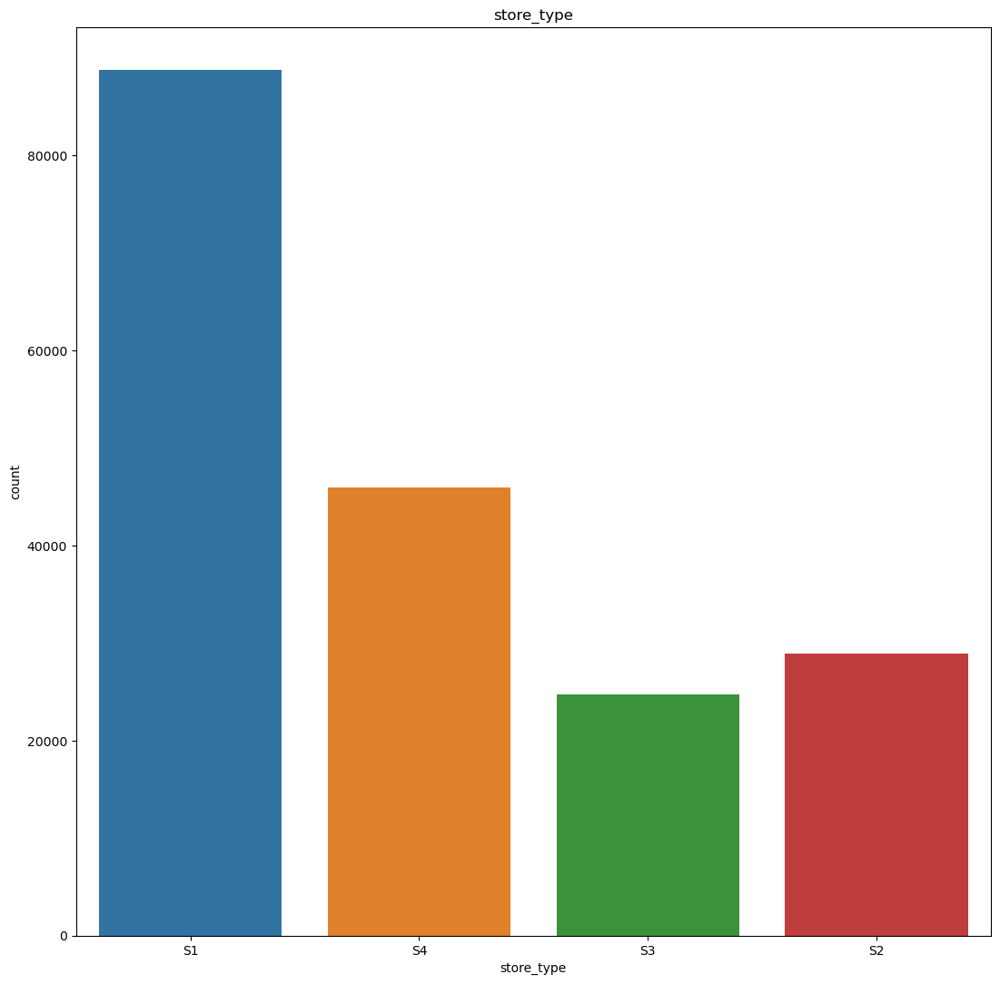

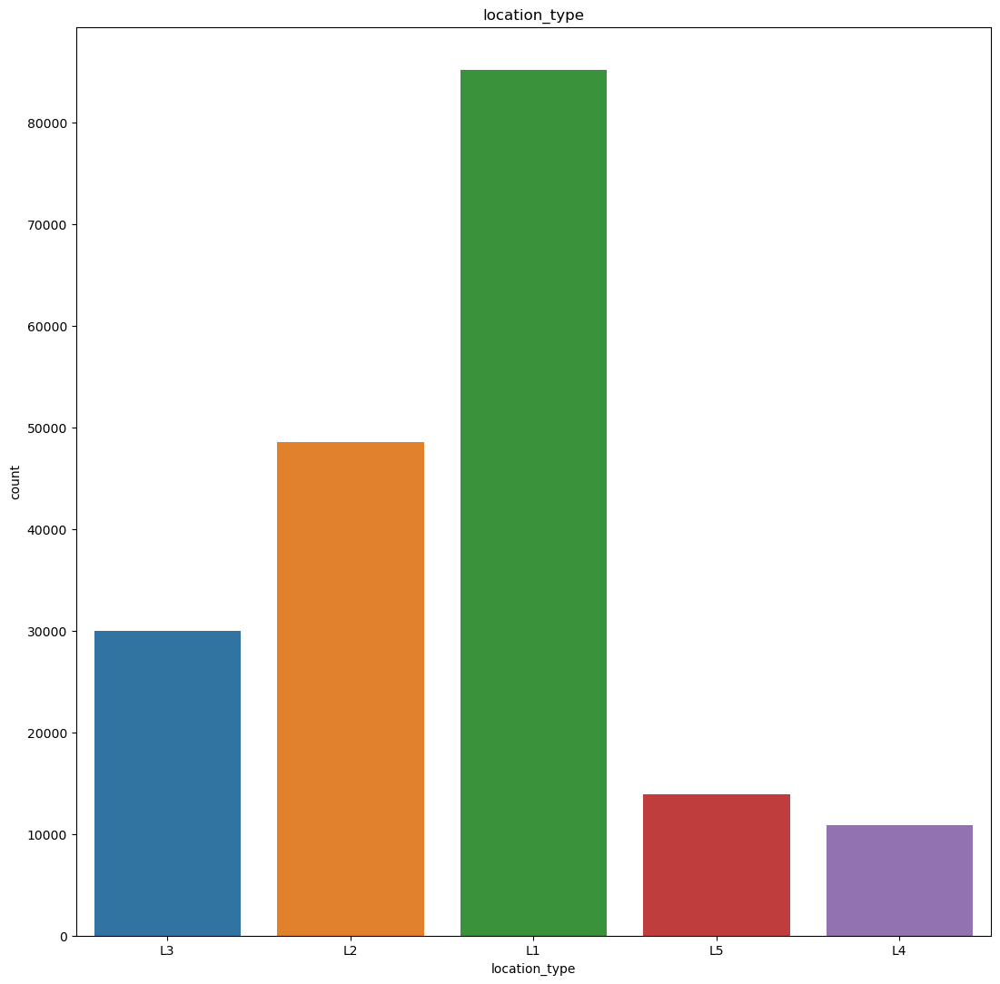

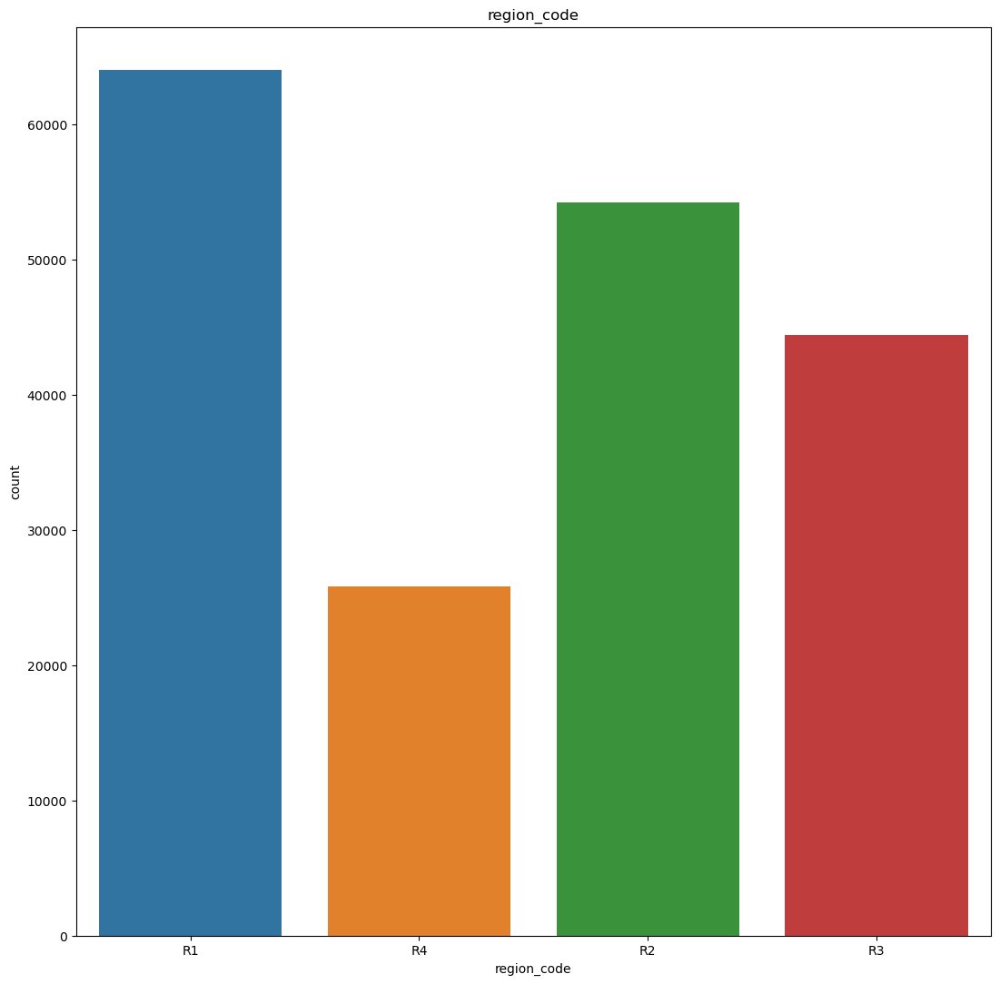

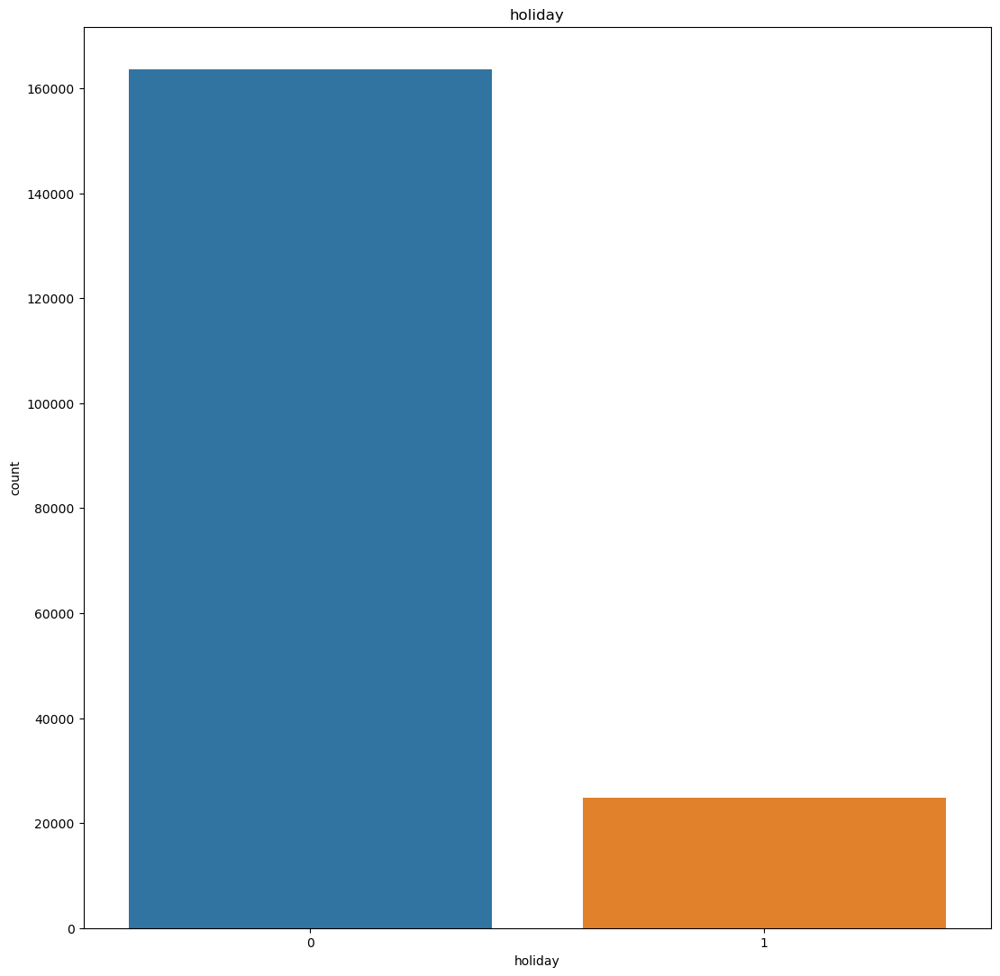

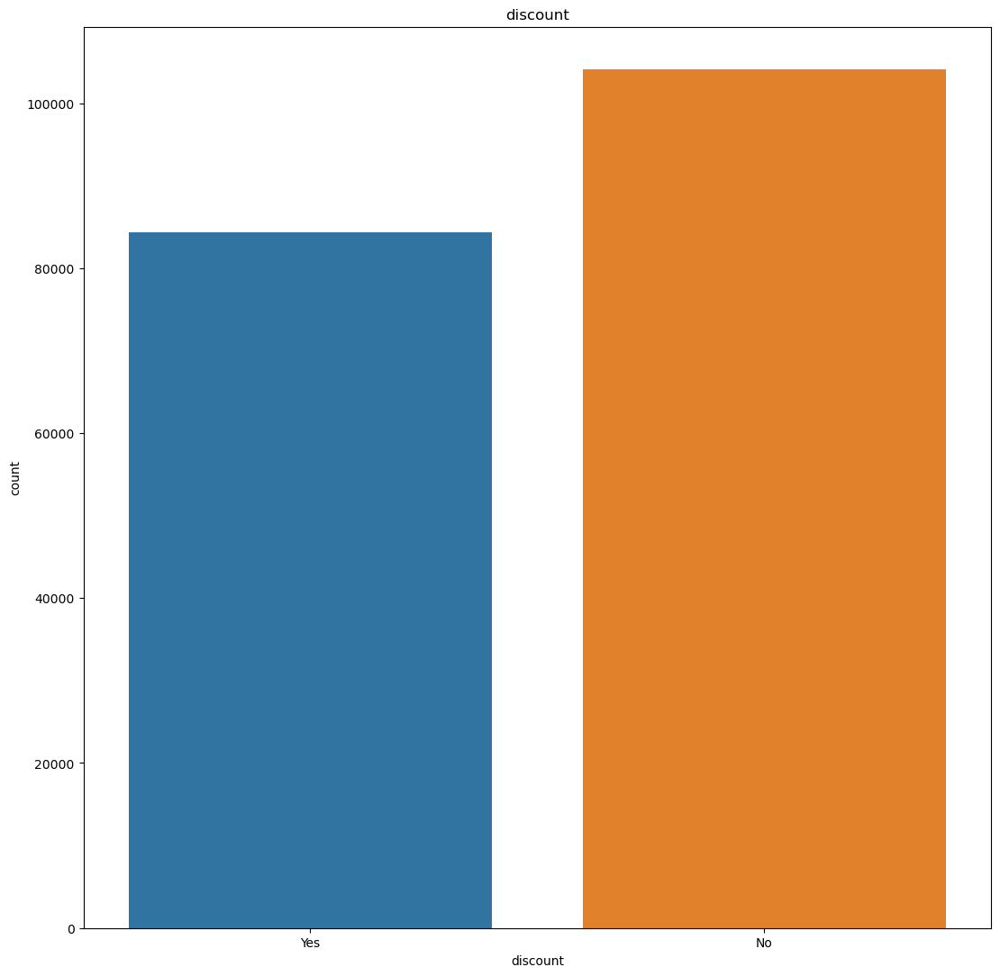

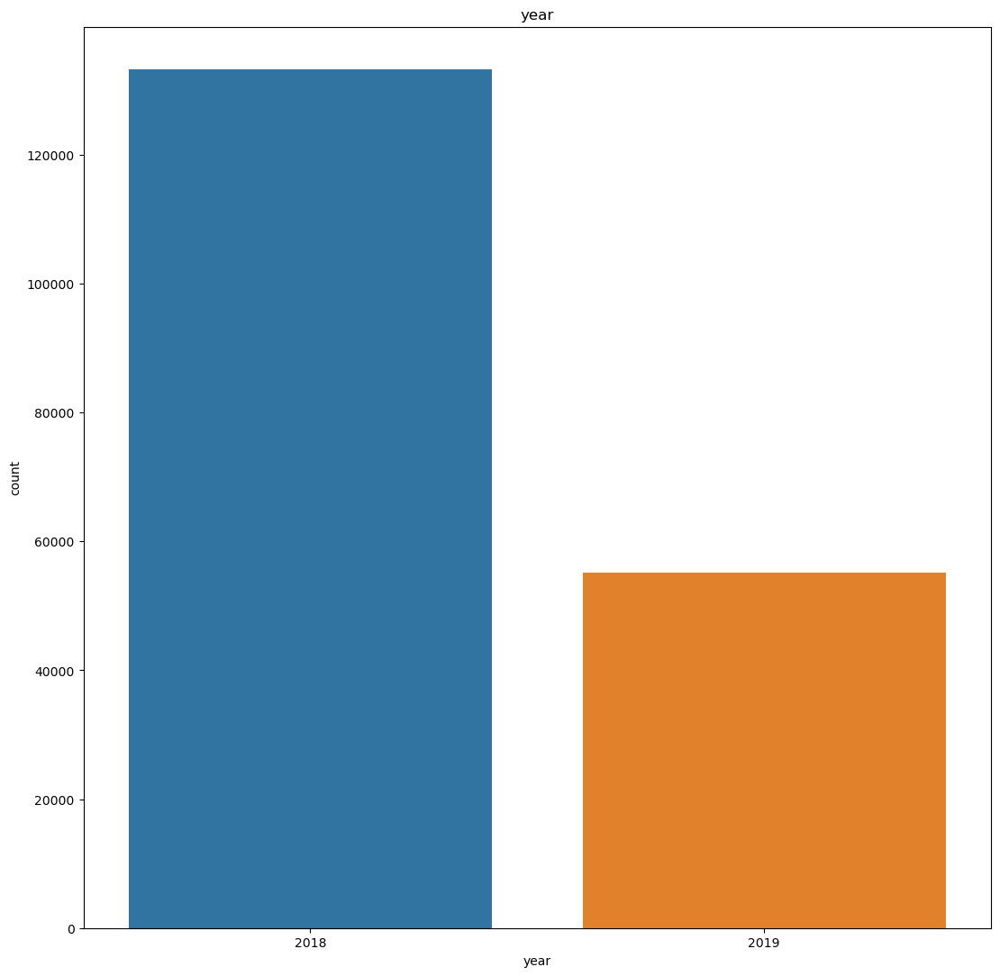

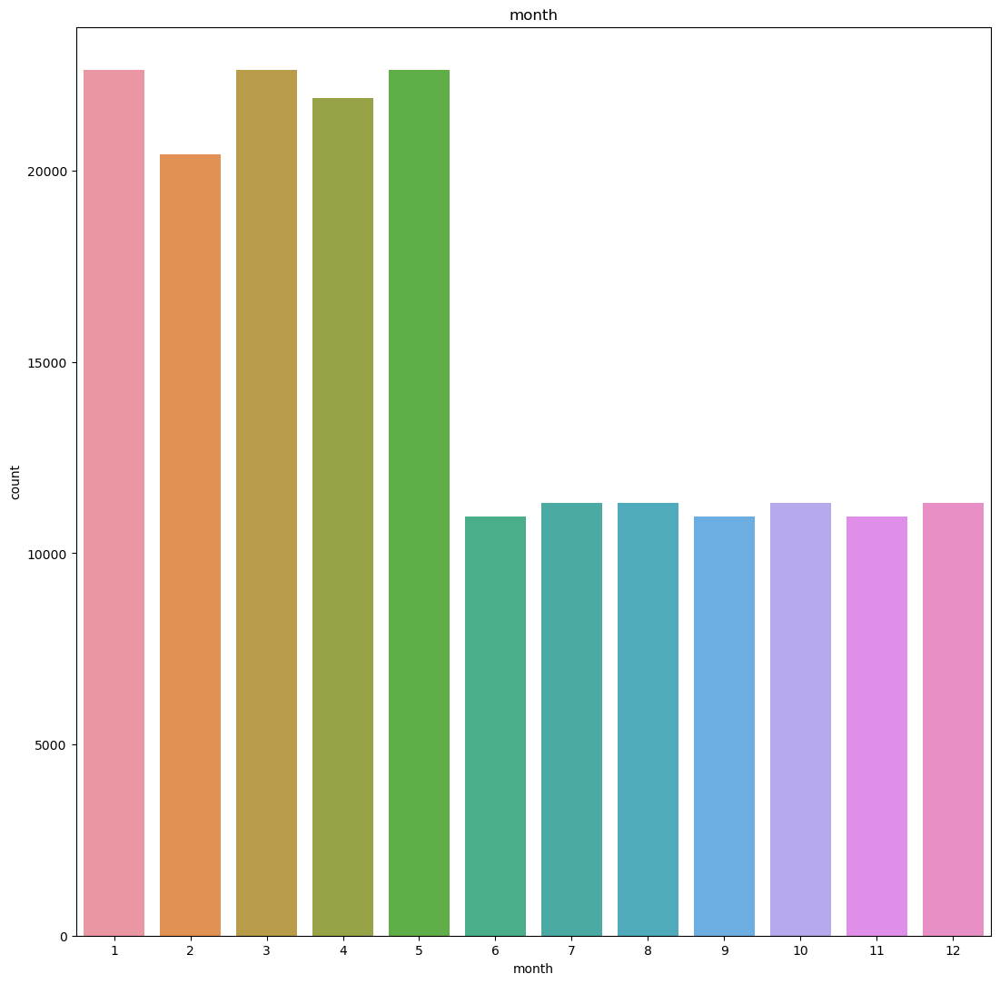

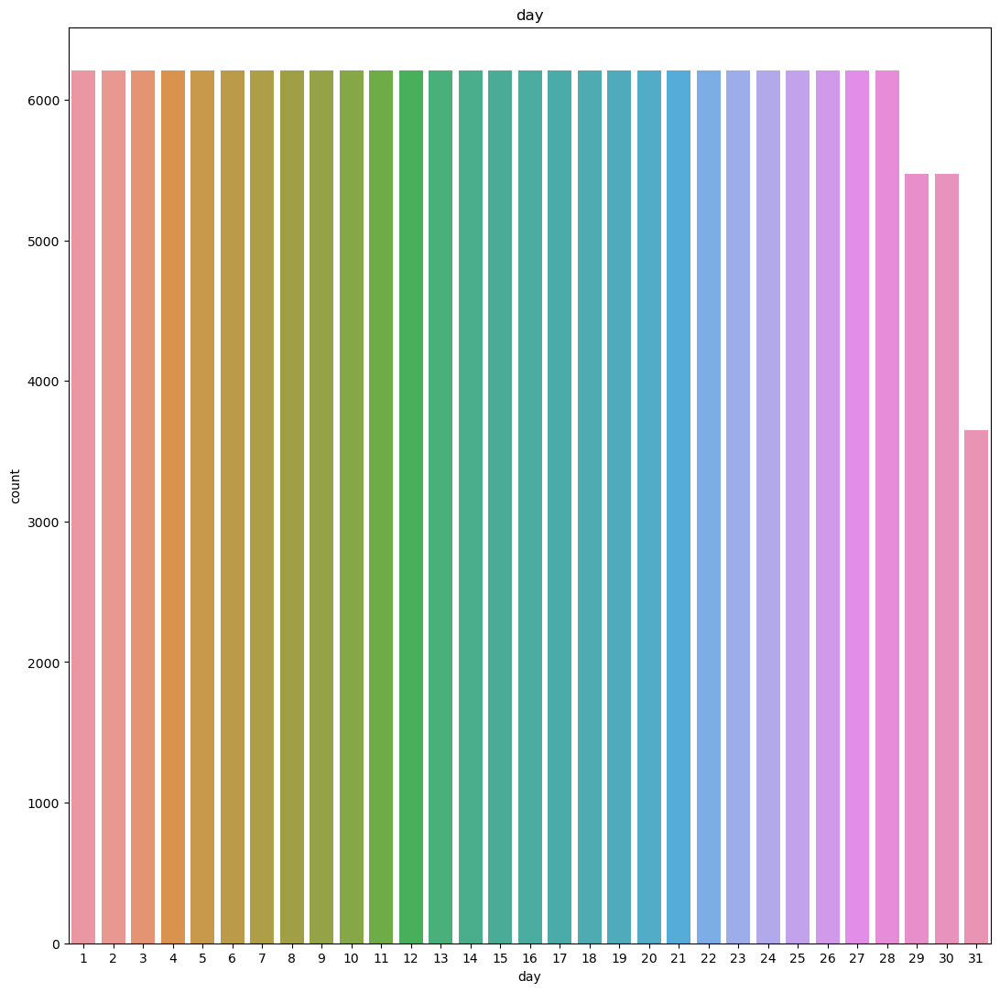

In [56]:
for i in cat_list:
    
    plt.figure(figsize=(13,13))
    sns.countplot(x=i,data=df.loc[:,cat_list])
    plt.title(i)

In [57]:
fig = px.pie(df, values='year', names='year')
fig.show()


In [58]:
fig = px.pie(df, values='holiday', names='year')
fig.show()

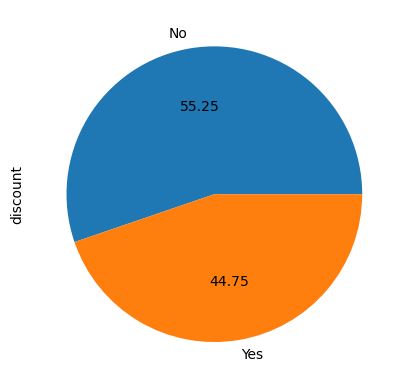

In [59]:
df["discount"].value_counts().plot(kind="pie",autopct="%.2f");

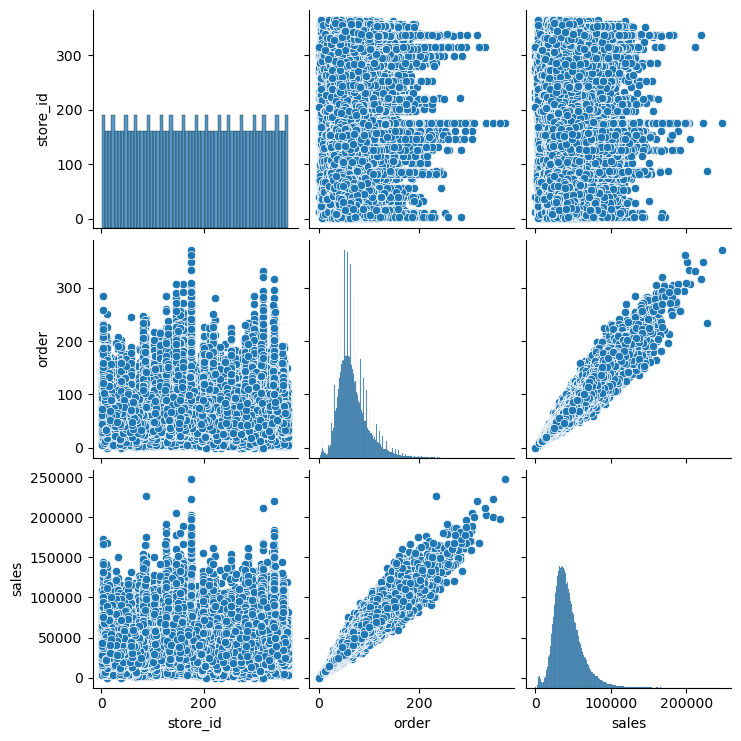

In [60]:
sns.pairplot(df.loc[:,num_list]);

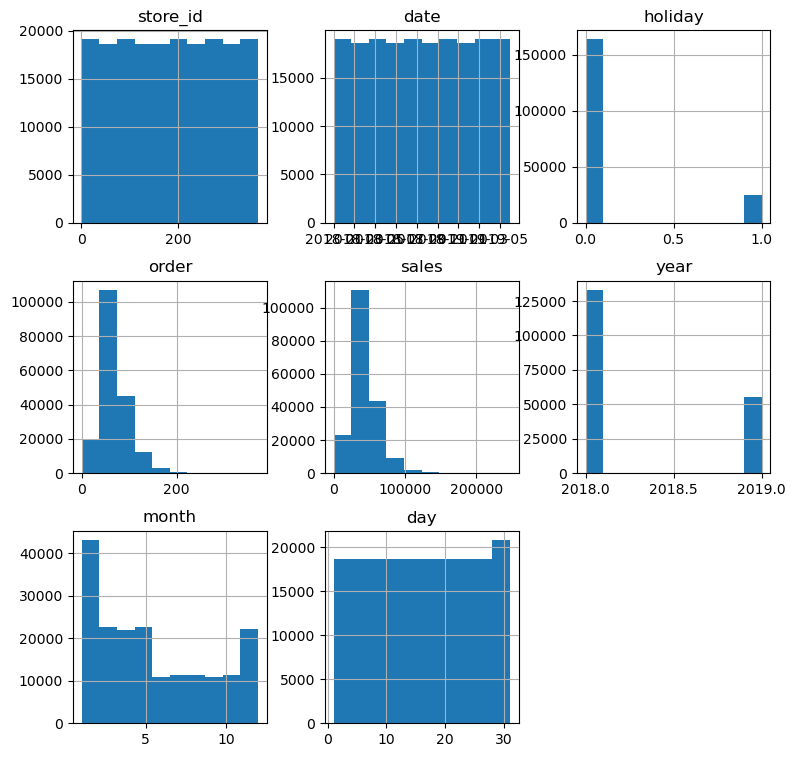

In [61]:
df.hist(figsize=(9,9));

<Axes: xlabel='store_type', ylabel='sales'>

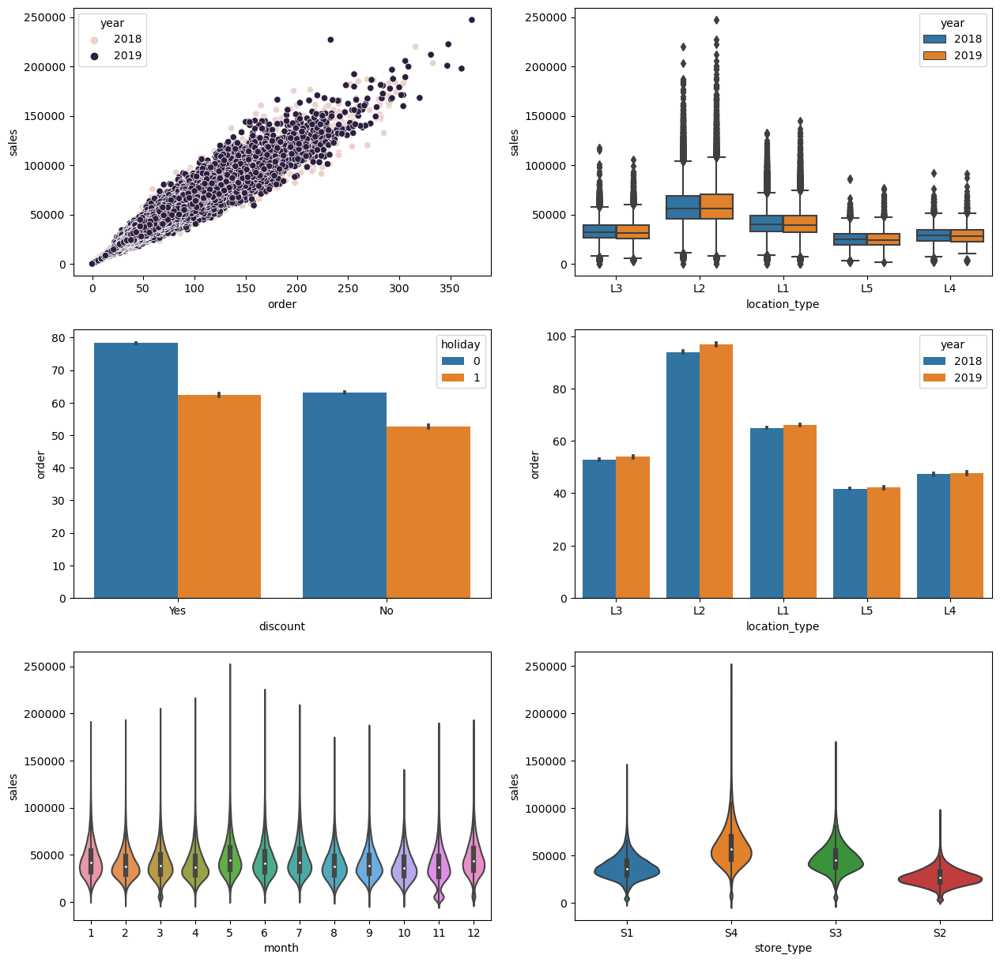

In [62]:
plt.figure(figsize=(15,15))
plt.subplot(3,2,1)
sns.scatterplot(x ='order',y ='sales',hue="year",data = df)
plt.subplot(3,2,2)
sns.boxplot(x ='location_type',y ='sales',hue="year",data = df)
plt.subplot(3,2,3)
sns.barplot(x ='discount',y ='order',hue="holiday",data = df)
plt.subplot(3,2,4)
sns.barplot(x ='location_type',y ='order',hue="year",data = df)
plt.subplot(3,2,5)
sns.violinplot(x ='month',y ='sales',data = df)
plt.subplot(3,2,6)
sns.violinplot(x ='store_type',y ='sales',data = df)

In [63]:
df.drop("date",inplace=True,axis=1)

In [64]:
df.head()

,store_id,store_type,location_type,region_code,holiday,discount,order,sales,year,month,day
0,1,S1,L3,R1,1,Yes,9,7011.84,2018,1,1
1,253,S4,L2,R1,1,Yes,60,51789.12,2018,1,1
2,252,S3,L2,R1,1,Yes,42,36868.20,2018,1,1
3,251,S2,L3,R1,1,Yes,23,19715.16,2018,1,1
4,250,S2,L3,R4,1,Yes,62,45614.52,2018,1,1


In [65]:
dms=pd.get_dummies(df[["discount","region_code","location_type",
                       "store_type"]])
dms

,discount_No,discount_Yes,region_code_R1,region_code_R2,region_code_R3,region_code_R4,location_type_L1,location_type_L2,location_type_L3,location_type_L4,location_type_L5,store_type_S1,store_type_S2,store_type_S3,store_type_S4
0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0
1,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1
2,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0
3,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0
4,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188335,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0
188336,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1
188337,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0
188338,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0


In [66]:
df.drop(["discount","region_code","location_type","store_type"],
        axis=1,inplace=True)
df.head()

,store_id,holiday,order,sales,year,month,day
0,1,1,9,7011.84,2018,1,1
1,253,1,60,51789.12,2018,1,1
2,252,1,42,36868.20,2018,1,1
3,251,1,23,19715.16,2018,1,1
4,250,1,62,45614.52,2018,1,1


In [67]:
df=pd.concat([df,dms],axis=1)
df.head()

,store_id,holiday,order,sales,year,month,day,discount_No,discount_Yes,region_code_R1,...,region_code_R4,location_type_L1,location_type_L2,location_type_L3,location_type_L4,location_type_L5,store_type_S1,store_type_S2,store_type_S3,store_type_S4
0,1,1,9,7011.84,2018,1,1,0,1,1,...,0,0,0,1,0,0,1,0,0,0
1,253,1,60,51789.12,2018,1,1,0,1,1,...,0,0,1,0,0,0,0,0,0,1
2,252,1,42,36868.20,2018,1,1,0,1,1,...,0,0,1,0,0,0,0,0,1,0
3,251,1,23,19715.16,2018,1,1,0,1,1,...,0,0,0,1,0,0,0,1,0,0
4,250,1,62,45614.52,2018,1,1,0,1,0,...,1,0,0,1,0,0,0,1,0,0


In [68]:
df_out_remove.head()

,store_id,store_type,location_type,region_code,date,holiday,discount,order,sales,year,month,day
0,1,S1,L3,R1,2018-01-01,1,Yes,9.0,7011.84,2018,1,1
1,253,S4,L2,R1,2018-01-01,1,Yes,60.0,51789.12,2018,1,1
2,252,S3,L2,R1,2018-01-01,1,Yes,42.0,36868.20,2018,1,1
3,251,S2,L3,R1,2018-01-01,1,Yes,23.0,19715.16,2018,1,1
4,250,S2,L3,R4,2018-01-01,1,Yes,62.0,45614.52,2018,1,1


In [69]:
dms2=pd.get_dummies(df_out_remove[["discount","region_code","location_type",
                       "store_type"]])
dms2

,discount_No,discount_Yes,region_code_R1,region_code_R2,region_code_R3,region_code_R4,location_type_L1,location_type_L2,location_type_L3,location_type_L4,location_type_L5,store_type_S1,store_type_S2,store_type_S3,store_type_S4
0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0
1,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1
2,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0
3,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0
4,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188335,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0
188336,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1
188337,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0
188338,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0


In [70]:
df_out_remove.drop(["discount","region_code","location_type","store_type"],
        axis=1,inplace=True)
df_out_remove.head()

,store_id,date,holiday,order,sales,year,month,day
0,1,2018-01-01,1,9.0,7011.84,2018,1,1
1,253,2018-01-01,1,60.0,51789.12,2018,1,1
2,252,2018-01-01,1,42.0,36868.20,2018,1,1
3,251,2018-01-01,1,23.0,19715.16,2018,1,1
4,250,2018-01-01,1,62.0,45614.52,2018,1,1


In [71]:
df2=pd.concat([df_out_remove,dms],axis=1)
df2.head()

,store_id,date,holiday,order,sales,year,month,day,discount_No,discount_Yes,...,region_code_R4,location_type_L1,location_type_L2,location_type_L3,location_type_L4,location_type_L5,store_type_S1,store_type_S2,store_type_S3,store_type_S4
0,1,2018-01-01,1,9.0,7011.84,2018,1,1,0,1,...,0,0,0,1,0,0,1,0,0,0
1,253,2018-01-01,1,60.0,51789.12,2018,1,1,0,1,...,0,0,1,0,0,0,0,0,0,1
2,252,2018-01-01,1,42.0,36868.20,2018,1,1,0,1,...,0,0,1,0,0,0,0,0,1,0
3,251,2018-01-01,1,23.0,19715.16,2018,1,1,0,1,...,0,0,0,1,0,0,0,1,0,0
4,250,2018-01-01,1,62.0,45614.52,2018,1,1,0,1,...,1,0,0,1,0,0,0,1,0,0


In [72]:
df2.drop("date",axis=1,inplace=True)
df2.head(2)

,store_id,holiday,order,sales,year,month,day,discount_No,discount_Yes,region_code_R1,...,region_code_R4,location_type_L1,location_type_L2,location_type_L3,location_type_L4,location_type_L5,store_type_S1,store_type_S2,store_type_S3,store_type_S4
0,1,1,9.0,7011.84,2018,1,1,0,1,1,...,0,0,0,1,0,0,1,0,0,0
1,253,1,60.0,51789.12,2018,1,1,0,1,1,...,0,0,1,0,0,0,0,0,0,1


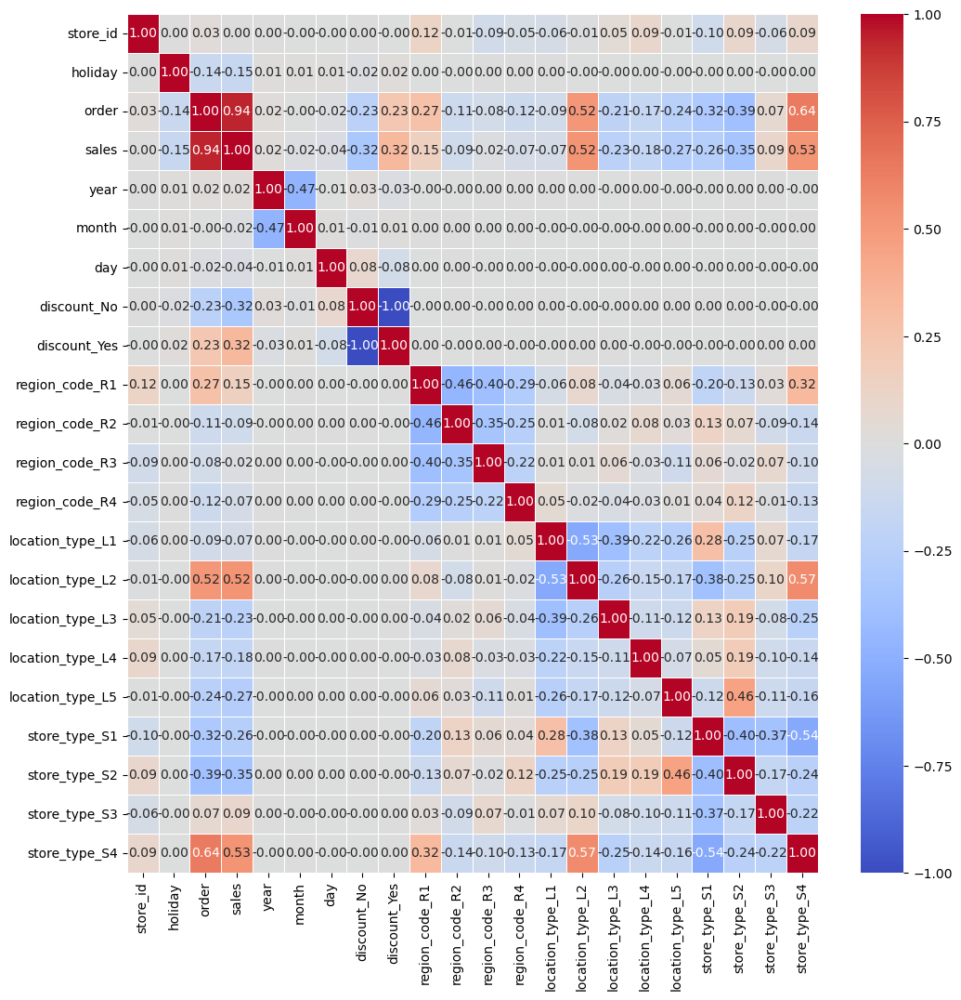

In [73]:
plt.figure(figsize=(12,12))
sns.heatmap(df.corr(),annot=True,linewidths=0.7,fmt=".2f",cmap="coolwarm")
plt.show()

In [74]:
df.drop("discount_Yes",axis=1,inplace=True)
df.head()

,store_id,holiday,order,sales,year,month,day,discount_No,region_code_R1,region_code_R2,...,region_code_R4,location_type_L1,location_type_L2,location_type_L3,location_type_L4,location_type_L5,store_type_S1,store_type_S2,store_type_S3,store_type_S4
0,1,1,9,7011.84,2018,1,1,0,1,0,...,0,0,0,1,0,0,1,0,0,0
1,253,1,60,51789.12,2018,1,1,0,1,0,...,0,0,1,0,0,0,0,0,0,1
2,252,1,42,36868.20,2018,1,1,0,1,0,...,0,0,1,0,0,0,0,0,1,0
3,251,1,23,19715.16,2018,1,1,0,1,0,...,0,0,0,1,0,0,0,1,0,0
4,250,1,62,45614.52,2018,1,1,0,0,0,...,1,0,0,1,0,0,0,1,0,0


In [75]:
cor=df.corr()["order"].sort_values(ascending=False)
pd.DataFrame({"column":cor.index,"Correlation with order":cor.values})

,column,Correlation with order
0,order,1.000000
1,sales,0.941601
2,store_type_S4,0.637189
3,location_type_L2,0.515078
4,region_code_R1,0.268874
5,store_type_S3,0.069705
6,store_id,0.028290
7,year,0.022860
8,month,-0.002864
9,day,-0.017951


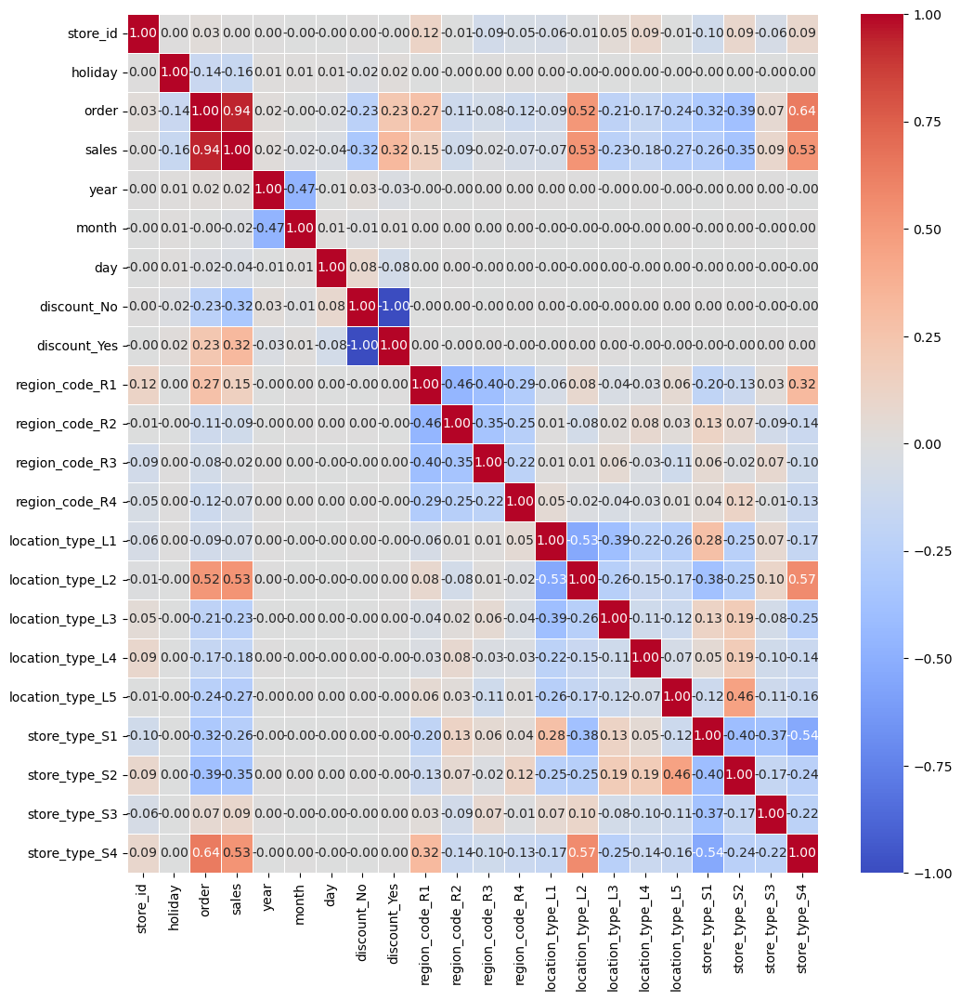

In [76]:
plt.figure(figsize=(12,12))
sns.heatmap(df2.corr(),annot=True,linewidths=0.7,fmt=".2f",cmap="coolwarm")
plt.show()

In [77]:
df2.drop("discount_Yes",axis=1,inplace=True)
df2.head()

,store_id,holiday,order,sales,year,month,day,discount_No,region_code_R1,region_code_R2,...,region_code_R4,location_type_L1,location_type_L2,location_type_L3,location_type_L4,location_type_L5,store_type_S1,store_type_S2,store_type_S3,store_type_S4
0,1,1,9.0,7011.84,2018,1,1,0,1,0,...,0,0,0,1,0,0,1,0,0,0
1,253,1,60.0,51789.12,2018,1,1,0,1,0,...,0,0,1,0,0,0,0,0,0,1
2,252,1,42.0,36868.20,2018,1,1,0,1,0,...,0,0,1,0,0,0,0,0,1,0
3,251,1,23.0,19715.16,2018,1,1,0,1,0,...,0,0,0,1,0,0,0,1,0,0
4,250,1,62.0,45614.52,2018,1,1,0,0,0,...,1,0,0,1,0,0,0,1,0,0


In [79]:
X=df.drop("order",axis=1)   #bağımsız değişkenler
y=df["order"]  # bağımlı değişkenler

In [80]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,
                                               random_state=0)

In [81]:
!pip install catboost

     -------------------------------------- 101.0/101.0 MB 4.6 MB/s eta 0:00:00
     ---------------------------------------- 47.0/47.0 kB 2.3 MB/s eta 0:00:00


In [82]:
!pip install lightgbm

     ---------------------------------------- 1.3/1.3 MB 5.6 MB/s eta 0:00:00


In [83]:
!pip install xgboost

     ---------------------------------------- 70.9/70.9 MB 4.6 MB/s eta 0:00:00


In [84]:
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

In [85]:
ridge=Ridge().fit(X_train,y_train)
lasso=Lasso().fit(X_train,y_train)
enet=ElasticNet().fit(X_train,y_train)
knn=KNeighborsRegressor().fit(X_train,y_train)
ada=AdaBoostRegressor().fit(X_train,y_train)

In [86]:
svm=SVR().fit(X_train,y_train)

In [87]:
mlpc=MLPRegressor().fit(X_train,y_train)
dtc=DecisionTreeRegressor().fit(X_train,y_train)

In [88]:
rf=RandomForestRegressor().fit(X_train,y_train)
xgb=XGBRegressor().fit(X_train,y_train)
gbm=GradientBoostingRegressor().fit(X_train,y_train)
lgb=LGBMRegressor().fit(X_train,y_train)
catbost=CatBoostRegressor().fit(X_train,y_train)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in the train set: 141255, number of used features: 20
[LightGBM] [Info] Start training from score 68.217741
Learning rate set to 0.089512
0:	learn: 28.1804195	total: 158ms	remaining: 2m 37s
1:	learn: 26.0722056	total: 174ms	remaining: 1m 26s
2:	learn: 24.1756708	total: 190ms	remaining: 1m 3s
3:	learn: 22.4365174	total: 207ms	remaining: 51.6s
4:	learn: 20.8819620	total: 224ms	remaining: 44.7s
5:	learn: 19.4575036	total: 240ms	remaining: 39.7s
6:	learn: 18.1713927	total: 255ms	remaining: 36.1s
7:	learn: 17.0318428	total: 270ms	remaining: 33.4s
8:	learn: 15.9828461	total: 284ms	remaining: 31.2s
9:	learn: 15.0510970	total: 297ms	remaining: 29.4s
10:	learn: 14.2248363	total: 312ms	remaining: 28

In [89]:
models=[ridge,lasso,enet,knn,ada,svm,mlpc,dtc,rf,xgb,gbm,lgb,catbost]

In [90]:
def ML(y,models):
    accuary=models.score(X_train,y_train)
    return accuary

In [ ]:
for i in models:
     print(i,"Algorithm succed rate :",ML("order",i))

Ridge() Algorithm succed rate : 0.9317144726711414
Lasso() Algorithm succed rate : 0.9103770371900162
ElasticNet() Algorithm succed rate : 0.9018988621300609
KNeighborsRegressor() Algorithm succed rate : 0.916002454467046
AdaBoostRegressor() Algorithm succed rate : 0.9059176923764621


In [ ]:
X2=df2.drop("order",axis=1)   #bağımsız değişkenler
y2=df2["order"]  # bağımlı değişkenler

In [93]:
X_train2,X_test2,y_train2,y_test2=train_test_split(X2,y2,test_size=0.25,
                                               random_state=0)


In [94]:
xgb2=XGBRegressor().fit(X_train2,y_train2)

In [95]:
xgb2.score(X_train2,y_train2)

0.9922239085350129

In [96]:
catbost2=CatBoostRegressor().fit(X_train2,y_train2)

Learning rate set to 0.089512
0:	learn: 28.1194348	total: 16.7ms	remaining: 16.7s
1:	learn: 26.0111815	total: 33.1ms	remaining: 16.5s
2:	learn: 24.1131888	total: 47.8ms	remaining: 15.9s
3:	learn: 22.3728536	total: 62.5ms	remaining: 15.6s
4:	learn: 20.8170739	total: 77.2ms	remaining: 15.4s
5:	learn: 19.3926443	total: 92.7ms	remaining: 15.4s
6:	learn: 18.1062470	total: 110ms	remaining: 15.6s
7:	learn: 16.9644222	total: 127ms	remaining: 15.8s
8:	learn: 15.9139748	total: 143ms	remaining: 15.8s
9:	learn: 14.9864263	total: 159ms	remaining: 15.7s
10:	learn: 14.1609124	total: 174ms	remaining: 15.7s
11:	learn: 13.4345306	total: 191ms	remaining: 15.7s
12:	learn: 12.7386167	total: 208ms	remaining: 15.8s
13:	learn: 12.1387234	total: 224ms	remaining: 15.8s
14:	learn: 11.5994699	total: 241ms	remaining: 15.8s
15:	learn: 11.1003533	total: 256ms	remaining: 15.8s
16:	learn: 10.6878412	total: 273ms	remaining: 15.8s
17:	learn: 10.3115815	total: 288ms	remaining: 15.7s
18:	learn: 9.9852064	total: 304ms	rema

In [97]:
lgb3=LGBMRegressor().fit(X_train2,y_train2)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in the train set: 141255, number of used features: 20
[LightGBM] [Info] Start training from score 68.209320


In [98]:
lgb3.score(X_train2,y_train2)

0.9836476796506896